In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his/')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-2409.54269823]
 [-2409.54269823]
 [-2346.73652817]
 ..., 
 [  106.677363  ]
 [  106.677363  ]
 [  106.677363  ]]
Logp of trace:  a  chain:  1  =  [ 106.27612593]
Logp of trace:  a  chain:  2  =  [ 104.98161132]
Logp of trace:  a  chain:  3  =  [ 107.73187224]
Logp of trace:  a  chain:  4  =  [ 107.5457703]
Logp of trace:  a  chain:  5  =  [ 105.68261938]
Logp of trace:  a  chain:  6  =  [ 105.75173277]
Logp of trace:  a  chain:  7  =  [ 106.63421018]
Logp of trace:  a  chain:  8  =  [ 101.92711647]
Logp of trace:  a  chain:  9  =  [ 105.88732695]
Logp of trace:  a  chain:  10  =  [ 103.16757469]
Logp of trace:  a  chain:  11  =  [ 103.71067346]
Logp of trace:  b  chain: 0 =  [[-1400.15931776]
 [-1400.15931776]
 [-1079.26586473]
 ..., 
 [  151.01565198]
 [  151.01565198]
 [  151.01565198]]
Logp of trace:  b  chain:  1  =  [ 150.35925536]
Logp of trace:  b  chain:  2  =  [ 154.483629]
Logp of trace:  b  chain:  3  =  [ 147.99689241]
Logp of trace:  b  ch

In [6]:
traces['a'][0][:,72]

array([-1.05333294, -1.05333294, -1.05333294, ...,  0.04505864,
        0.04505864,  0.04505864])

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [8]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  36  of  88  parameters.
Percent of parameters with GR below 1.2:  40.9090909091
Number of parameters with GR below 1.1:  2  of  88  parameters.
Percent of parameters with GR below 1.1:  2.27272727273


[36, 40.909090909090914, 2, 2.272727272727273]

In [9]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  13  of  88  parameters.
Percent of parameters with GR below 1.2:  14.7727272727
Number of parameters with GR below 1.1:  2  of  88  parameters.
Percent of parameters with GR below 1.1:  2.27272727273


[13, 14.772727272727273, 2, 2.272727272727273]

In [10]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  8  of  88  parameters.
Percent of parameters with GR below 1.2:  9.09090909091
Number of parameters with GR below 1.1:  0  of  88  parameters.
Percent of parameters with GR below 1.1:  0.0


[8, 9.090909090909092, 0, 0.0]

In [11]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  32  of  88  parameters.
Percent of parameters with GR below 1.2:  36.3636363636
Number of parameters with GR below 1.1:  4  of  88  parameters.
Percent of parameters with GR below 1.1:  4.54545454545


[32, 36.36363636363637, 4, 4.545454545454546]

50000
12
50000


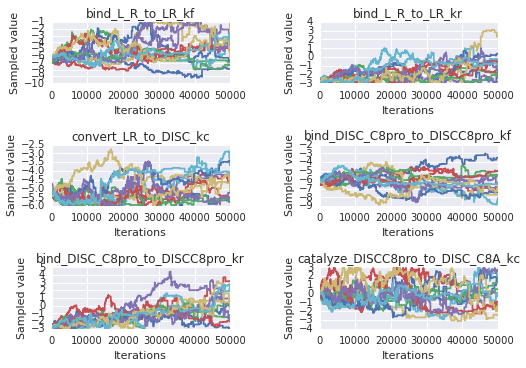

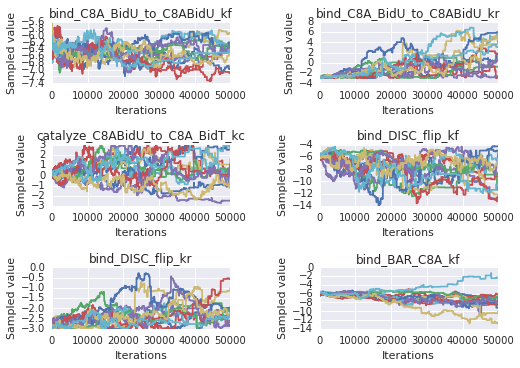

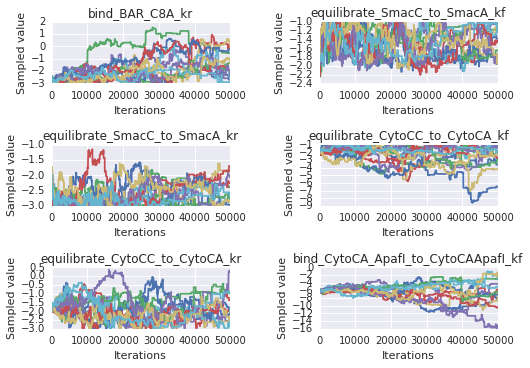

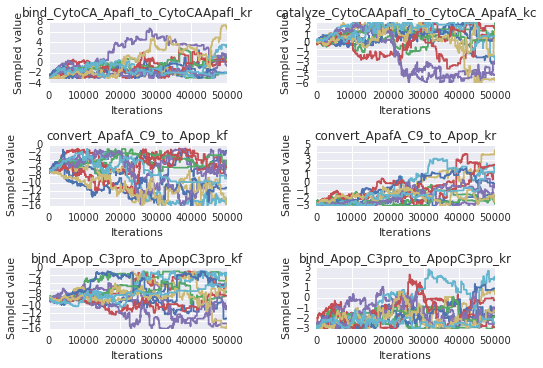

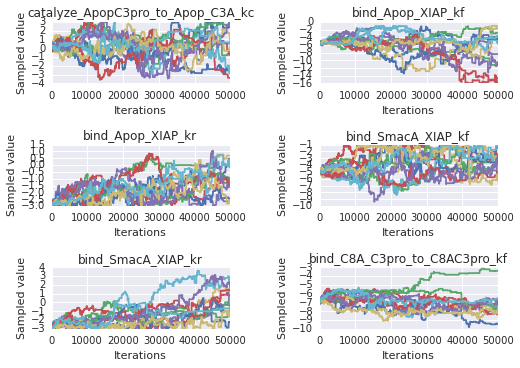

...

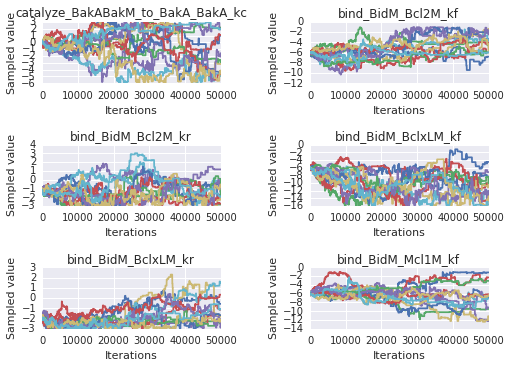

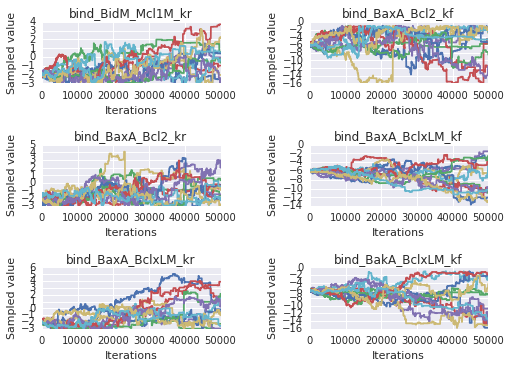

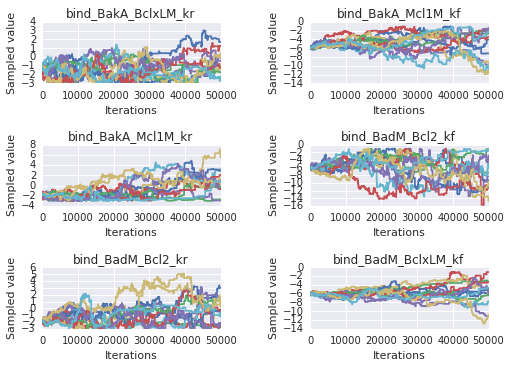

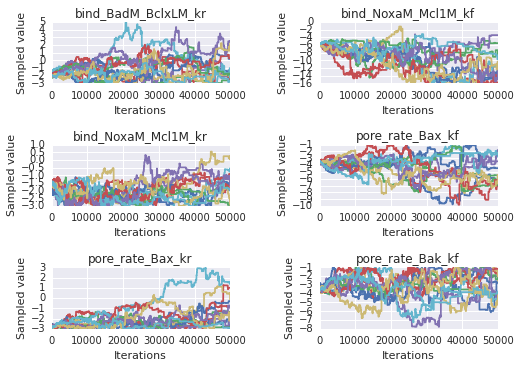

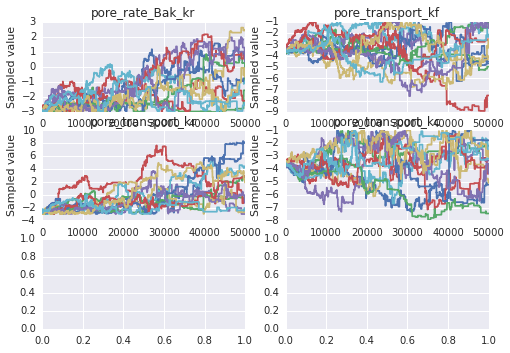

In [12]:
sample_plots(param_trace_dicts['a'])

In [13]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


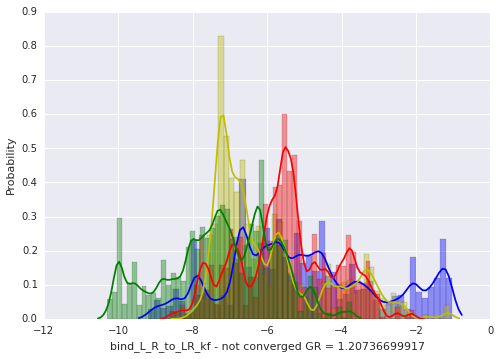

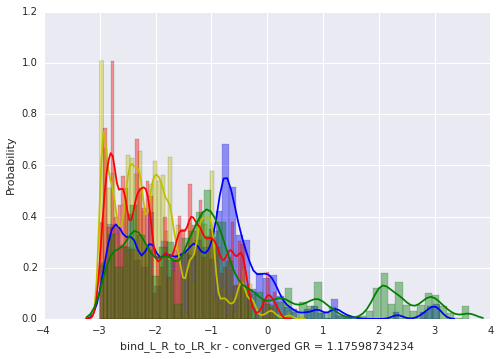

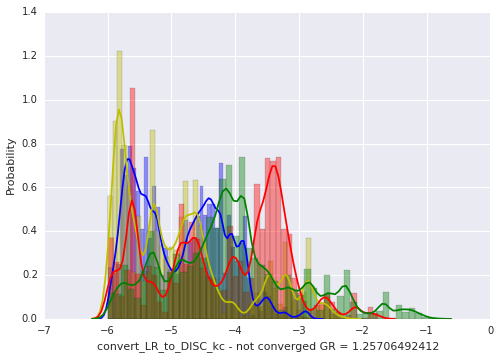

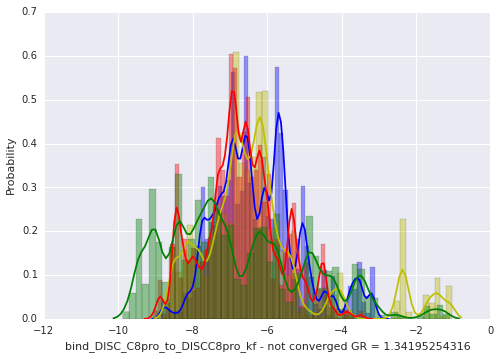

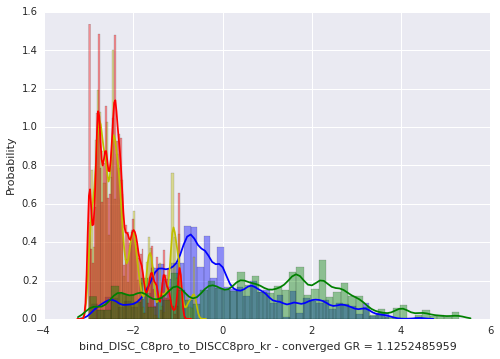

...

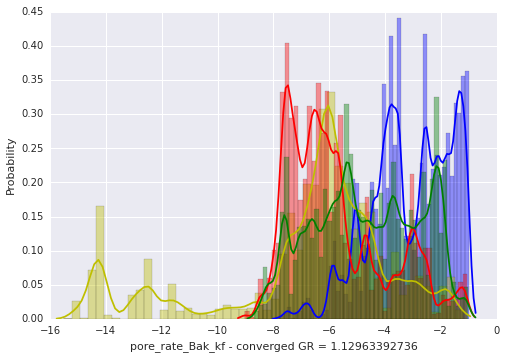

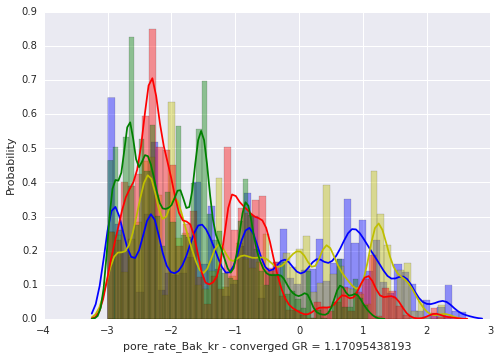

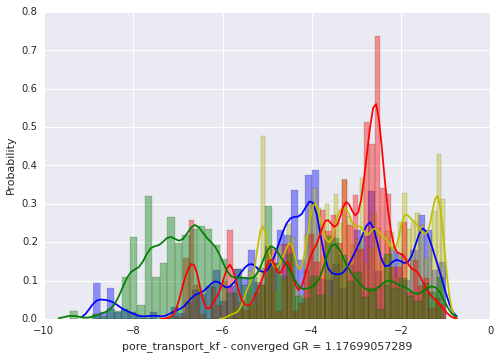

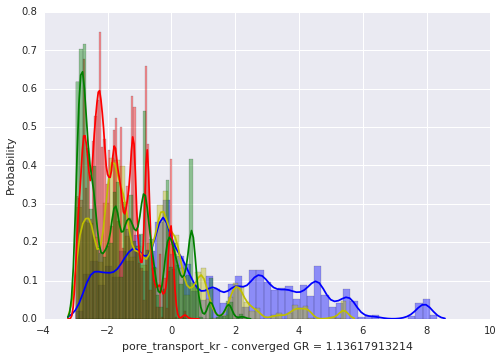

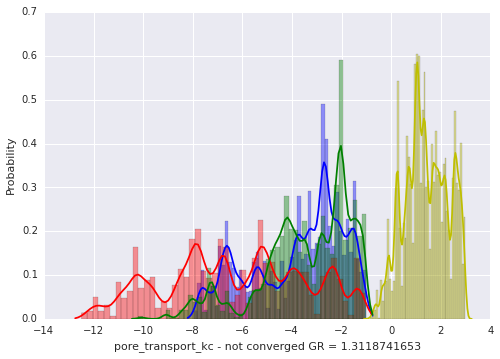

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [15]:
traces['a'][1][:,0]

array([-6.21029731, -6.21029731, -6.22322915, ..., -6.86965499,
       -6.86965499, -6.86965499])

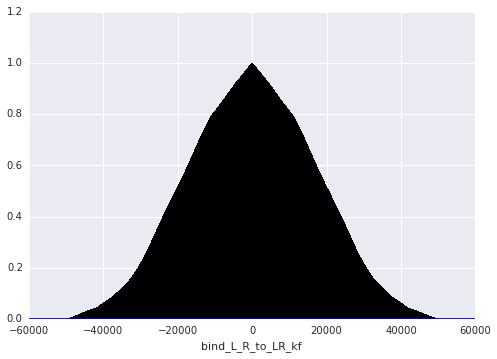

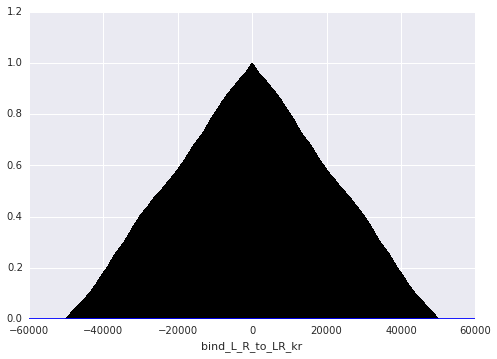

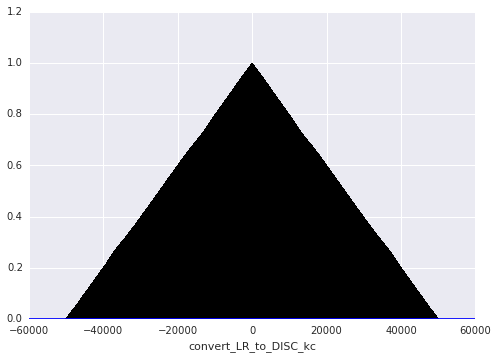

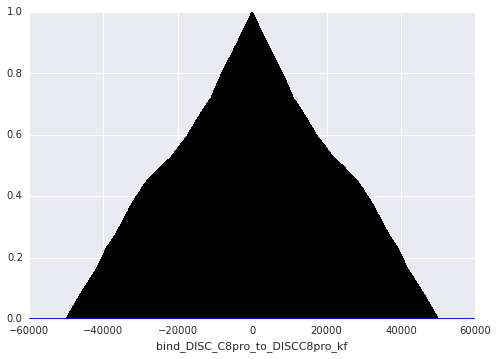

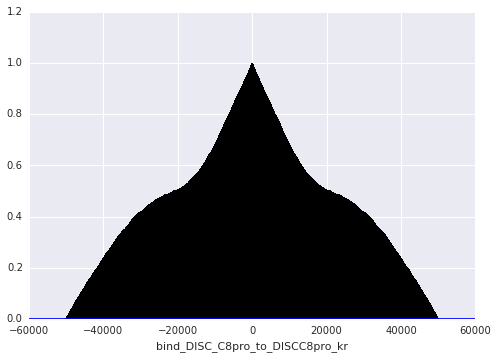

...

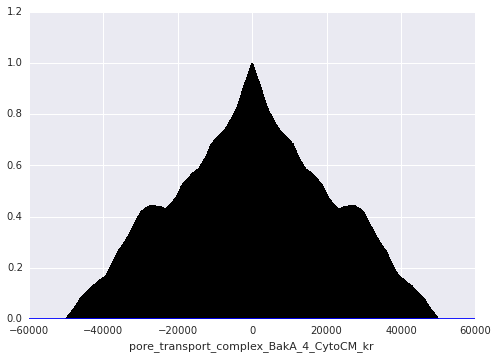

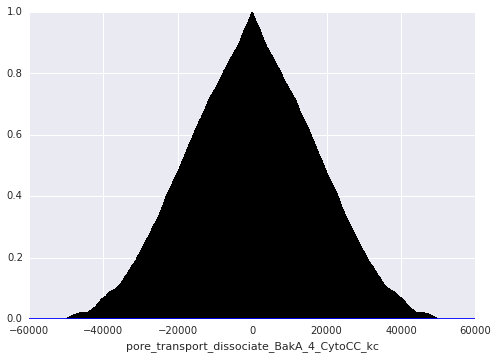

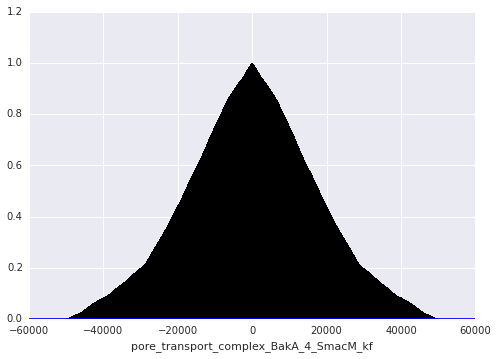

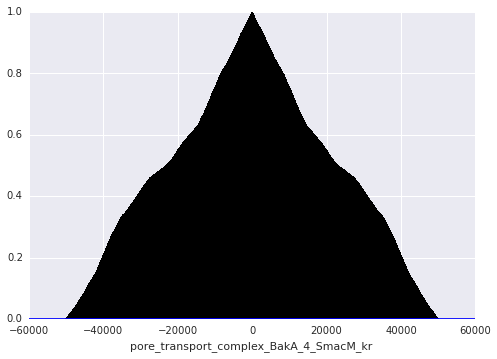

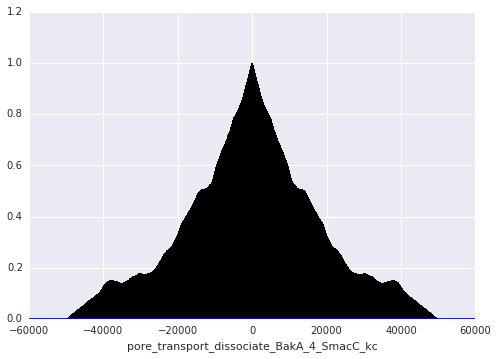

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [16]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  579  acceptance rate:  0.01158
N acceptances for parameter:  bind_L_R_to_LR_kr  =  625  acceptance rate:  0.0125
N acceptances for parameter:  convert_LR_to_DISC_kc  =  596  acceptance rate:  0.01192
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  577  acceptance rate:  0.01154
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  612  acceptance rate:  0.01224
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  595  acceptance rate:  0.0119
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  605  acceptance rate:  0.0121
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  617  acceptance rate:  0.01234
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  613  acceptance rate:  0.01226
N acceptances for parameter:  bind_DISC_flip_kf  =  641  acceptance rate:  0.01282
N acceptances for parameter:  bind_DISC_flip_kr  =  622  acceptance rate:  0.01244
N accept

IndexError: list index out of range

In [17]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

 N acceptances for parameter:  bind_L_R_to_LR_kf  =  509  acceptance rate:  0.01018
N acceptances for parameter:  bind_L_R_to_LR_kr  =  526  acceptance rate:  0.01052
N acceptances for parameter:  convert_LR_to_DISC_kc  =  502  acceptance rate:  0.01004
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  513  acceptance rate:  0.01026
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  527  acceptance rate:  0.01054
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  524  acceptance rate:  0.01048
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  502  acceptance rate:  0.01004
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  524  acceptance rate:  0.01048
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  520  acceptance rate:  0.0104
N acceptances for parameter:  bind_DISC_flip_kf  =  521  acceptance rate:  0.01042
N acceptances for parameter:  bind_DISC_flip_kr  =  521  acceptance rate:  0.01042
N acc

IndexError: list index out of range

In [18]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

 N acceptances for parameter:  bind_L_R_to_LR_kf  =  548  acceptance rate:  0.01096
N acceptances for parameter:  bind_L_R_to_LR_kr  =  599  acceptance rate:  0.01198
N acceptances for parameter:  convert_LR_to_DISC_kc  =  572  acceptance rate:  0.01144
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  561  acceptance rate:  0.01122
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  592  acceptance rate:  0.01184
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  588  acceptance rate:  0.01176
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  569  acceptance rate:  0.01138
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  596  acceptance rate:  0.01192
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  599  acceptance rate:  0.01198
N acceptances for parameter:  bind_DISC_flip_kf  =  604  acceptance rate:  0.01208
N acceptances for parameter:  bind_DISC_flip_kr  =  612  acceptance rate:  0.01224
N ac

IndexError: list index out of range

In [19]:
acceptance_rates = np.zeros((len(traces['b'][3][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

 N acceptances for parameter:  bind_L_R_to_LR_kf  =  548  acceptance rate:  0.01096
N acceptances for parameter:  bind_L_R_to_LR_kr  =  599  acceptance rate:  0.01198
N acceptances for parameter:  convert_LR_to_DISC_kc  =  572  acceptance rate:  0.01144
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  561  acceptance rate:  0.01122
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  592  acceptance rate:  0.01184
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  588  acceptance rate:  0.01176
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  569  acceptance rate:  0.01138
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  596  acceptance rate:  0.01192
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  599  acceptance rate:  0.01198
N acceptances for parameter:  bind_DISC_flip_kf  =  604  acceptance rate:  0.01208
N acceptances for parameter:  bind_DISC_flip_kr  =  612  acceptance rate:  0.01224
N ac

IndexError: index 88 is out of bounds for axis 0 with size 88

In [20]:
acceptance_rates = np.zeros((len(traces['b'][4][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  548  acceptance rate:  0.01096
N acceptances for parameter:  bind_L_R_to_LR_kr  =  599  acceptance rate:  0.01198
N acceptances for parameter:  convert_LR_to_DISC_kc  =  572  acceptance rate:  0.01144
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  561  acceptance rate:  0.01122
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  592  acceptance rate:  0.01184
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  588  acceptance rate:  0.01176
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  569  acceptance rate:  0.01138
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  596  acceptance rate:  0.01192
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  599  acceptance rate:  0.01198
N acceptances for parameter:  bind_DISC_flip_kf  =  604  acceptance rate:  0.01208
N acceptances for parameter:  bind_DISC_flip_kr  =  612  acceptance rate:  0.01224
N acc

IndexError: index 88 is out of bounds for axis 0 with size 88